<h1 align = 'center'> Weather prediction </h1>

# Introduction:
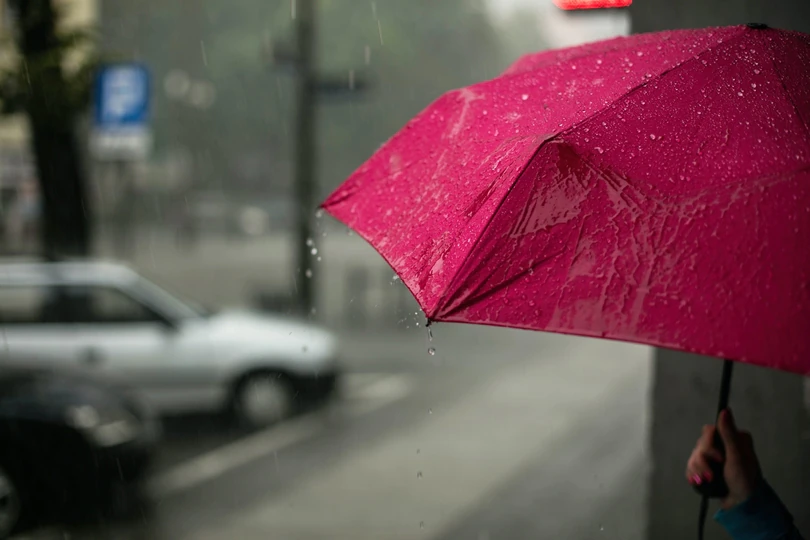


Accurate weather prediction plays a crucial role in various domains, including agriculture, transportation, and emergency planning. In this project, we aim to develop a machine learning model to predict whether it will rain tomorrow or not. By leveraging historical weather data and employing supervised learning techniques, we will train a model that utilizes features such as temperature, rainfall, wind speed, humidity, and more. Our goal is to create a reliable and accurate model that can assist in forecasting rain conditions for Australia. Through this project, we aim to contribute to the field of weather forecasting and enable better decision-making based on accurate predictions.

Our Dataset is loaded from **Kaggle** which is an online community and platform for data science and machine learning it provides a wide range of resources and tools for data scientists, including datasets, competitions, courses, and a collaborative environment for sharing knowledge and code.



In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.impute import SimpleImputer

from sklearn.preprocessing import LabelEncoder

from sklearn.preprocessing import MinMaxScaler

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve, roc_auc_score

from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier, export_graphviz
import graphviz

from sklearn.model_selection import GridSearchCV

from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score

from sklearn.preprocessing import StandardScaler, normalize

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as shc
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score



#Load the dataset

In [ ]:
data = pd.read_csv("weather.csv")
data.head()

,Unnamed: 0,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
0,0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No
1,1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No
2,2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No
3,3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No
4,4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     25000 non-null  int64  
 1   Date           25000 non-null  object 
 2   Location       25000 non-null  object 
 3   MinTemp        24669 non-null  float64
 4   MaxTemp        24824 non-null  float64
 5   Rainfall       24721 non-null  float64
 6   Evaporation    9432 non-null   float64
 7   Sunshine       6664 non-null   float64
 8   WindGustDir    21543 non-null  object 
 9   WindGustSpeed  21545 non-null  float64
 10  WindDir9am     21928 non-null  object 
 11  WindDir3pm     23267 non-null  object 
 12  WindSpeed9am   24428 non-null  float64
 13  WindSpeed3pm   23770 non-null  float64
 14  Humidity9am    24609 non-null  float64
 15  Humidity3pm    23936 non-null  float64
 16  Pressure9am    20172 non-null  float64
 17  Pressure3pm    20173 non-null  float64
 18  Cloud9

In [ ]:
data.describe()

,Unnamed: 0,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RISK_MM
count,25000.000000,24669.000000,24824.000000,24721.000000,9432.000000,6664.000000,21545.000000,24428.000000,23770.000000,24609.000000,23936.000000,20172.000000,20173.000000,14136.000000,13815.000000,24755.000000,24082.000000,25000.000000
mean,12499.500000,13.294568,23.990558,2.674467,5.825138,7.811945,37.772755,12.686917,16.837106,69.822951,52.762826,1018.173290,1015.627438,4.251556,4.409265,17.953084,22.507171,2.677376
std,7217.022701,5.848304,6.114348,9.720306,4.871567,3.718698,13.212331,9.136115,9.095719,17.755908,21.210121,6.481112,6.394829,2.968785,2.719235,5.394685,5.954540,9.705604
min,0.000000,-3.300000,6.800000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,3.000000,1.000000,980.500000,979.000000,0.000000,0.000000,0.300000,6.400000,0.000000
25%,6249.750000,8.900000,19.500000,0.000000,3.000000,5.500000,28.000000,6.000000,9.000000,58.000000,37.000000,1013.800000,1011.300000,1.000000,2.000000,14.200000,18.100000,0.000000
50%,12499.500000,14.000000,23.400000,0.000000,4.800000,8.900000,35.000000,11.000000,17.000000,71.000000,54.000000,1018.200000,1015.700000,5.000000,5.000000,18.400000,21.900000,0.000000
75%,18749.250000,17.900000,27.700000,0.600000,7.200000,10.600000,46.000000,19.000000,22.000000,83.000000,68.000000,1022.600000,1020.000000,7.000000,7.000000,21.900000,26.100000,0.800000
max,24999.000000,29.700000,47.300000,371.000000,86.200000,14.000000,135.000000,130.000000,83.000000,100.000000,100.000000,1039.900000,1036.800000,8.000000,8.000000,37.700000,46.700000,371.000000


In [ ]:
data.isnull().sum()

Unnamed: 0           0
Date                 0
Location             0
MinTemp            331
MaxTemp            176
Rainfall           279
Evaporation      15568
Sunshine         18336
WindGustDir       3457
WindGustSpeed     3455
WindDir9am        3072
WindDir3pm        1733
WindSpeed9am       572
WindSpeed3pm      1230
Humidity9am        391
Humidity3pm       1064
Pressure9am       4828
Pressure3pm       4827
Cloud9am         10864
Cloud3pm         11185
Temp9am            245
Temp3pm            918
RainToday          279
RISK_MM              0
RainTomorrow         0
dtype: int64

We want to see in where cities it rains the most so we will make a visualization for that.

In [ ]:
city_names = data['Location'].unique()

# Get the count of unique city names
num_cities = len(city_names)

# Print the number of cities and their names
print("Number of cities:", num_cities)
print("City names:")
for city in city_names:
    print(city)

Number of cities: 9
City names:
Albury
BadgerysCreek
Cobar
CoffsHarbour
Moree
Newcastle
NorahHead
NorfolkIsland
Penrith


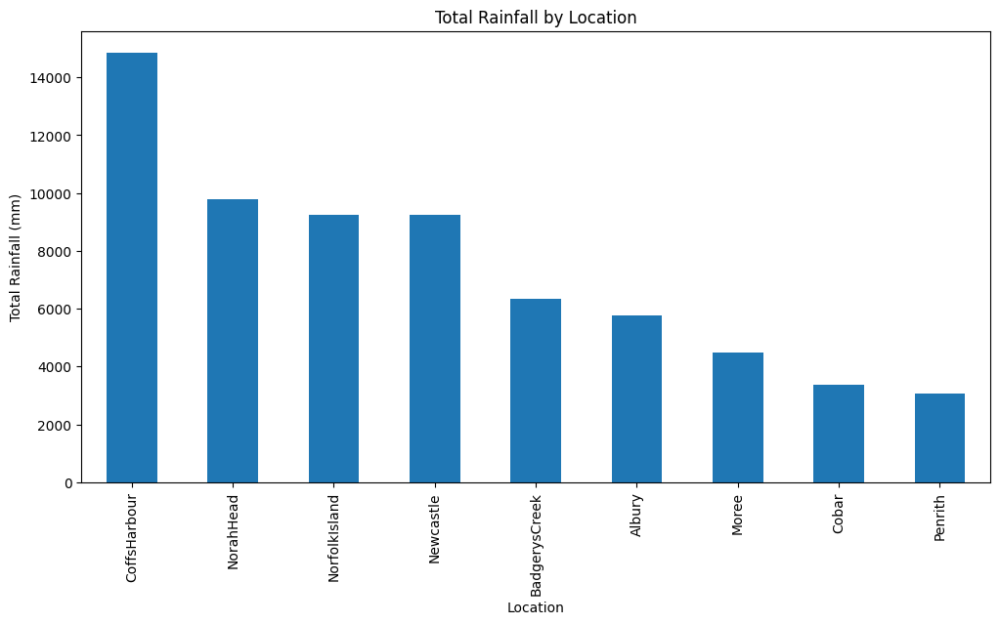

In [ ]:
location_rainfall = data.groupby('Location')['Rainfall'].sum()

# Sorting the locations by total rainfall in descending order
location_rainfall = location_rainfall.sort_values(ascending=False)

# Plotting the bar chart
plt.figure(figsize=(12, 6))
location_rainfall.plot(kind='bar')
plt.title('Total Rainfall by Location')
plt.xlabel('Location')
plt.ylabel('Total Rainfall (mm)')
plt.xticks(rotation=90)
plt.show()

So we notice that the city where it rains the most is CoffsHarbour.

Now we will create a line plot showing the variation of temperature (MinTemp and MaxTemp) over time.

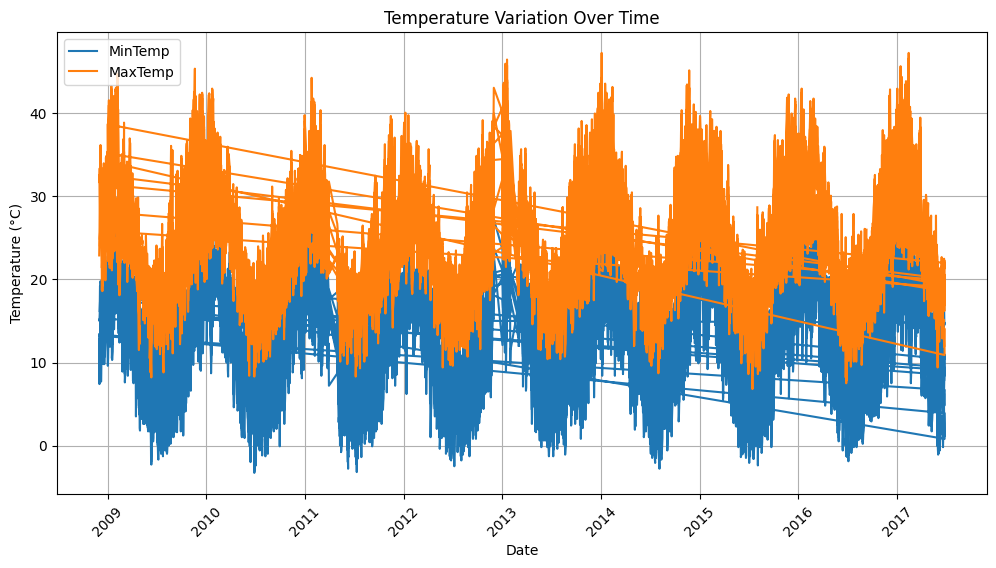

In [ ]:
data['Date'] = pd.to_datetime(data['Date'])

# Plotting the temperature variation over time
plt.figure(figsize=(12, 6))
plt.plot(data['Date'], data['MinTemp'], label='MinTemp')
plt.plot(data['Date'], data['MaxTemp'], label='MaxTemp')
plt.title('Temperature Variation Over Time')
plt.xlabel('Date')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

As we notice here that the temperatures get higher in the end and the beginning of the years it means in december and january and they get lower in the middle of the year it means june and july we can conclude that the seasons are different from ours (Tunisia).

Now we'll make a wind rose plot to display the distribution of wind directions.

In [ ]:
! pip install windrose

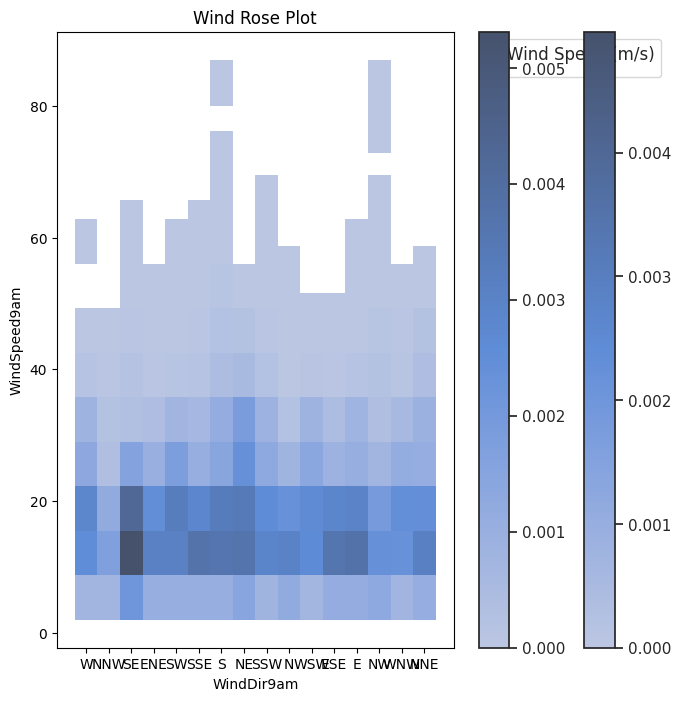

In [ ]:
wind_direction_columns = ['WindDir9am', 'WindDir3pm']
wind_speed_columns = ['WindSpeed9am', 'WindSpeed3pm']

# Filter the rows with non-null values for wind direction and wind speed
filtered_df = data.dropna(subset=wind_direction_columns + wind_speed_columns)

# Set up the figure and axes
fig, ax = plt.subplots(figsize=(8, 8))
sns.set_theme(style="white")
ax.set_title('Wind Rose Plot')

# Plot wind directions and wind speeds
for direction_column, speed_column in zip(wind_direction_columns, wind_speed_columns):
    sns.histplot(data=filtered_df, x=direction_column, y=speed_column, bins=12, stat="density", linewidth=0, cbar=True, ax=ax)

# Set the legend
ax.legend(title='Wind Speed (m/s)', loc='upper left', bbox_to_anchor=(1.1, 1))

# Display the plot
plt.show()

# Data Preprocessing

## Explore the dataset

In [ ]:
!pip install -U dataprep

Computing histogram-sum-sum-sum-aggregate-5d663c1d3e6aafbf8a7ebe2de7f1e15c:  24%|██▍       | 398/1657 [00:00<00:01, 1093.34it/s]           /usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1633: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  b2 = skew(a, axis)
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1738: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  b2 = kurtosis(a, axis, fisher=False)
/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1738: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  b2 = kurtosis(a, axis, fisher=False)
/usr/local/lib/python3.10/dist-packa


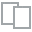
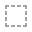
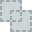
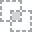
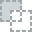
...
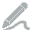
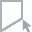
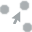
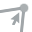
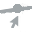

In [ ]:
from dataprep.eda import plot
plot(data)

Computing histogram-sum-sum-sum-aggregate-48a5663791a41abf824b1adc9b9904d7:  43%|████▎     | 1890/4369 [00:04<00:03, 722.94it/s]/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1633: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  b2 = skew(a, axis)
Computing skewtest-e6f86fd8a649137d394ab49c0f016047:  45%|████▌     | 1980/4369 [00:04<00:03, 750.11it/s]                       /usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_py.py:1738: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  b2 = kurtosis(a, axis, fisher=False)
Computing size-chunk-4adccc1c6e202fd124b9f317e6b538c0-211fd1dfe3016f9fb71040d5712f1cfc:  73%|███████▎  | 3175/4369 [00:05<00:00, 1272.68it/s]/usr/local/lib/python3.10/dist-packages/scipy/stats/_stats_

DataPrep Report
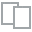
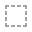
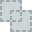
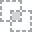
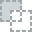
...
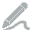
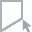
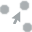
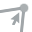
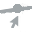

In [ ]:
from dataprep.eda import create_report
create_report(data)

- We can notice that the column "Unnamed: 0" is an index column and does not provide any useful information for weather prediction so we will delete it.
- After creating a report about our data with Dataprep we noticed that the "Evaporation" column has got 62.3% missing values which is a big percentage of the data so we will delete this column.
- We noticed also that the "Sunshine" column has got 73.3% missing values and that's a big percentage so we will delete as well.
- The "Cloud9am" column has got 43.5% missing values which we consider as a big percentage of data so we will delete it as well as the "Cloud3pm" column which has 44.7% of missing values.

- We also noticed that there's a high correlation between "MinTemp" and "Temp9am" and between "MaxTemp" and "Temp3pm" so we will delete the columns  "Temp9am" and "Temp3pm".
- We also notice that "Pressure9am" and"Pressure3pm" have a high correlation so we will delete one of them let's say "Pressure9am".


In [ ]:
columns_to_delete = ['Unnamed: 0', 'Evaporation', 'Sunshine', 'Cloud9am', 'Cloud3pm', 'Pressure9am']
data = data.drop(columns=columns_to_delete)


In [ ]:
columns_to_delete = ['Temp9am', 'Temp3pm']
data = data.drop(columns=columns_to_delete)

Now for cleaning the data we need to verify if the distribution of the data is normal or skewed to know if we will replace the missing values with the mean or the median.

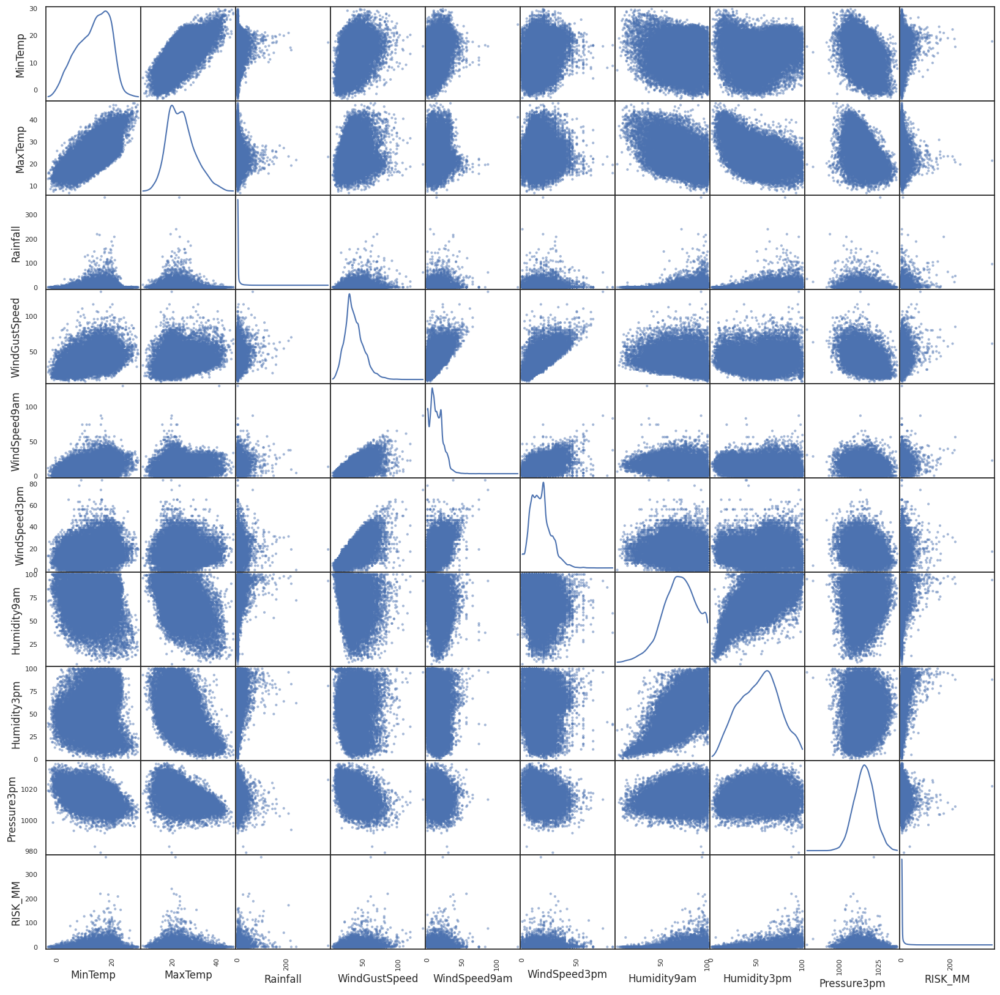

In [ ]:
pd.plotting.scatter_matrix(data,figsize=(20, 20),  diagonal='kde')
plt.show()

## Handling missing values

In [ ]:

# Create a SimpleImputer object to replace missing values with the median
imputer = SimpleImputer(strategy='median')
columns_median = ["MinTemp", "MaxTemp", "WindGustSpeed", "WindSpeed9am", "WindSpeed3pm", "Humidity9am", "Humidity3pm", "Pressure3pm"]
# Impute missing values in the numerical columns of the DataFrame
data[columns_median] = imputer.fit_transform(data[columns_median])

In [ ]:
# Create a SimpleImputer object to replace missing values with the mode
imputer = SimpleImputer(strategy='most_frequent')
columns_mode =  ["Rainfall"]
# Impute missing values in the numerical columns of the DataFrame
data[columns_mode] = imputer.fit_transform(data[columns_mode])

In [ ]:
categorical_columns = ["WindDir9am", "WindDir3pm","WindGustDir","RainToday"]

# Replace missing values in each categorical column with the mode
for column in categorical_columns:
    data[column].fillna(data[column].mode()[0], inplace=True)

In [ ]:
data.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure3pm      0
RainToday        0
RISK_MM          0
RainTomorrow     0
dtype: int64

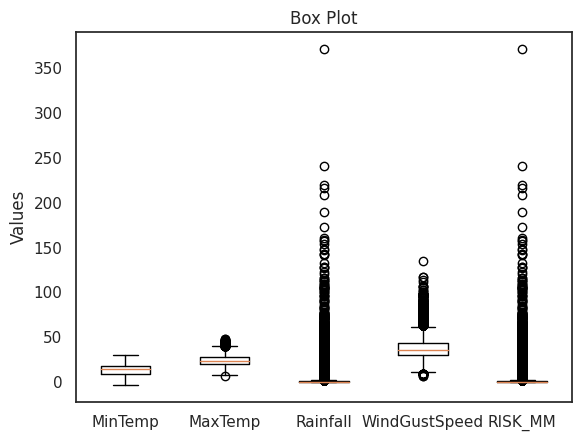

In [ ]:
columns = ["MinTemp", "MaxTemp", "Rainfall", "WindGustSpeed", "RISK_MM"]

fig, ax = plt.subplots()
ax.boxplot(data[columns])
ax.set_xticklabels(columns)
ax.set_ylabel('Values')
ax.set_title('Box Plot')

plt.show()

Here we have outliers for "Rainfall" and "RISK_MM" but we will keep tham becuse it's normal to have them because our weather values are distributed on a long period so we can't consider them as outliers the weather can change and give different values.

## Data Transformation

Now we will prepare the data for the Machine Learning models and we will start by the "Date" column we will  extract  components from the "Date" column, such as year, month, day, and weekday, these components can be represented as separate numerical features and used for model training.

In [ ]:
data['Date'] = pd.to_datetime(data['Date'])

# Extract components from the 'Date' column
data['Year'] = data['Date'].dt.year
data['Month'] = data['Date'].dt.month
data['Day'] = data['Date'].dt.day
data['Weekday'] = data['Date'].dt.weekday

# Drop the original 'Date' column if no longer needed
data = data.drop('Date', axis=1)

print(data)

      Location  MinTemp  MaxTemp  Rainfall WindGustDir  WindGustSpeed  \
0       Albury     13.4     22.9       0.6           W           44.0   
1       Albury      7.4     25.1       0.0         WNW           44.0   
2       Albury     12.9     25.7       0.0         WSW           46.0   
3       Albury      9.2     28.0       0.0          NE           24.0   
4       Albury     17.5     32.3       1.0           W           41.0   
...        ...      ...      ...       ...         ...            ...   
24995  Penrith     16.5     30.0       0.0          NE           26.0   
24996  Penrith     16.7     30.5       0.0          NE           24.0   
24997  Penrith     18.3     29.8       0.0         ENE           26.0   
24998  Penrith     17.5     28.1       0.0         NNE           22.0   
24999  Penrith     15.4     30.9       0.0          NE           24.0   

      WindDir9am WindDir3pm  WindSpeed9am  WindSpeed3pm  Humidity9am  \
0              W        WNW          20.0          

In [ ]:
data['Year'].value_counts()

2009    3251
2010    3183
2011    2979
2012    2976
2016    2849
2014    2817
2015    2786
2013    2702
2017    1366
2008      91
Name: Year, dtype: int64

In [ ]:
df = data[['Year', 'RainTomorrow']]

# Apply one-hot encoding to the 'Raintomorrow' column
df = pd.get_dummies(df, columns=['RainTomorrow'])

# Group by 'year' and calculate the mean of the other features
grouped = df.groupby('Year').mean()
grouped

,RainTomorrow_No,RainTomorrow_Yes
Year,,
2008,0.813187,0.186813
2009,0.796678,0.203322
2010,0.755891,0.244109
2011,0.753273,0.246727
2012,0.778226,0.221774
2013,0.808660,0.191340
2014,0.792332,0.207668
2015,0.758435,0.241565
2016,0.775360,0.224640


In [ ]:
years_to_drop = [2008, 2009, 2010, 2016, 2017]
data = data[~data['Year'].isin(years_to_drop)]
data = data.reset_index(drop=True)
data

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,RainToday,RISK_MM,RainTomorrow,Year,Month,Day,Weekday
752,Albury,23.2,35.8,0.0,ENE,26.0,S,WSW,13.0,9.0,46.0,29.0,1009.2,No,0.6,No,2011,1,1,5
753,Albury,20.1,31.1,0.6,W,35.0,SW,WSW,2.0,15.0,45.0,27.0,1009.5,No,0.0,No,2011,1,2,6
754,Albury,13.6,29.4,0.0,WNW,35.0,SSE,WNW,19.0,11.0,56.0,28.0,1009.3,No,0.0,No,2011,1,3,0
755,Albury,13.9,29.2,0.0,SSE,24.0,SE,SE,11.0,11.0,53.0,38.0,1007.8,No,0.0,No,2011,1,4,1
756,Albury,16.0,28.9,0.0,SSE,31.0,ENE,SW,4.0,9.0,57.0,31.0,1004.3,No,0.0,No,2011,1,5,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,Penrith,16.5,30.0,0.0,NE,26.0,SSE,NE,2.0,7.0,87.0,41.0,1015.7,No,0.0,No,2013,3,9,5
24996,Penrith,16.7,30.5,0.0,NE,24.0,ESE,N,4.0,6.0,84.0,44.0,1015.7,No,0.0,No,2013,3,10,6
24997,Penrith,18.3,29.8,0.0,ENE,26.0,SW,ESE,0.0,6.0,98.0,49.0,1015.7,No,0.0,No,2013,3,11,0
24998,Penrith,17.5,28.1,0.0,NNE,22.0,S,NE,4.0,7.0,90.0,54.0,1015.7,No,0.0,No,2013,3,12,1


In [ ]:
data['RainTomorrow'].value_counts(normalize=True)

No     0.7777
Yes    0.2223
Name: RainTomorrow, dtype: float64

In [ ]:

categorical_columns = ["Location", "WindGustDir", "WindDir9am", "WindDir3pm", "RainToday", "RainTomorrow" ]

label_encoder = LabelEncoder()

for column in categorical_columns:
    data[column] = label_encoder.fit_transform(data[column])

data.head()

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,RainToday,RISK_MM,RainTomorrow,Year,Month,Day,Weekday
0,0,23.2,35.8,0.0,1,26.0,8,15,13.0,9.0,46.0,29.0,1009.2,0,0.6,0,2011,1,1,5
1,0,20.1,31.1,0.6,13,35.0,12,15,2.0,15.0,45.0,27.0,1009.5,0,0.0,0,2011,1,2,6
2,0,13.6,29.4,0.0,14,35.0,10,14,19.0,11.0,56.0,28.0,1009.3,0,0.0,0,2011,1,3,0
3,0,13.9,29.2,0.0,10,24.0,9,9,11.0,11.0,53.0,38.0,1007.8,0,0.0,0,2011,1,4,1
4,0,16.0,28.9,0.0,10,31.0,1,12,4.0,9.0,57.0,31.0,1004.3,0,0.0,0,2011,1,5,2


In [ ]:
df1 = data.drop(columns = ['Year', 'Month', 'Day', 'Weekday'])
df1.head()

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,RainToday,RISK_MM,RainTomorrow
0,0,23.2,35.8,0.0,1,26.0,8,15,13.0,9.0,46.0,29.0,1009.2,0,0.6,0
1,0,20.1,31.1,0.6,13,35.0,12,15,2.0,15.0,45.0,27.0,1009.5,0,0.0,0
2,0,13.6,29.4,0.0,14,35.0,10,14,19.0,11.0,56.0,28.0,1009.3,0,0.0,0
3,0,13.9,29.2,0.0,10,24.0,9,9,11.0,11.0,53.0,38.0,1007.8,0,0.0,0
4,0,16.0,28.9,0.0,10,31.0,1,12,4.0,9.0,57.0,31.0,1004.3,0,0.0,0


In [ ]:
y = df1['RainTomorrow']
X = df1.drop(columns = ['RainTomorrow'])

In [ ]:

scaler = MinMaxScaler(feature_range=(0,1))
rescaledX = scaler.fit_transform(X)

# Convert X back to a Pandas DataFrame, for convenience
X = pd.DataFrame(rescaledX, index=X.index, columns=X.columns)
X.head()

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,RainToday,RISK_MM
0,0.0,0.809816,0.716049,0.0000,0.066667,0.148438,0.533333,1.000000,0.149425,0.108434,0.431579,0.282828,0.342857,0.0,0.0025
1,0.0,0.714724,0.600000,0.0025,0.866667,0.218750,0.800000,1.000000,0.022989,0.180723,0.421053,0.262626,0.350000,0.0,0.0000
2,0.0,0.515337,0.558025,0.0000,0.933333,0.218750,0.666667,0.933333,0.218391,0.132530,0.536842,0.272727,0.345238,0.0,0.0000
3,0.0,0.524540,0.553086,0.0000,0.666667,0.132812,0.600000,0.600000,0.126437,0.132530,0.505263,0.373737,0.309524,0.0,0.0000
4,0.0,0.588957,0.545679,0.0000,0.666667,0.187500,0.066667,0.800000,0.045977,0.108434,0.547368,0.303030,0.226190,0.0,0.0000


# Supervised Model Building

## Logistic Regression
Logistic regression is a statistical modeling technique used for binary classification problems, where the goal is to predict the probability of an instance belonging to one of two possible classes.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("Training set shape:", X_train.shape, y_train.shape)
print("Testing set shape:", X_test.shape, y_test.shape)

Training set shape: (11408, 15) (11408,)
Testing set shape: (2852, 15) (2852,)


In [ ]:
logreg = LogisticRegression()

logreg.fit(X_train, y_train)

y_pred = logreg.predict(X_test)

In [ ]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8772791023842917


In [ ]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[2162   50]
 [ 300  340]]


The metrics in a classification report, namely precision, recall, F1-score, and support, provide insights into the performance of a classification model. Here's a brief description of each metric:

- Precision: Precision measures the proportion of correctly predicted
positive instances out of all instances predicted as positive. It focuses on the accuracy of positive predictions and indicates how precise the model is in identifying positive instances.

- Recall: Recall, also known as sensitivity or true positive rate, measures the proportion of correctly predicted positive instances out of all actual positive instances. It focuses on the model's ability to find all positive instances and avoid false negatives.

- F1-score: The F1-score is the harmonic mean of precision and recall. It provides a single metric that balances both precision and recall. The F1-score is useful when you want to consider both the precision and recall simultaneously.

- Support: Support represents the number of instances in each class in the dataset. It provides information about the distribution of the classes and can help assess the prevalence of each class in the data.



In [ ]:
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.98      0.93      2212
           1       0.87      0.53      0.66       640

    accuracy                           0.88      2852
   macro avg       0.87      0.75      0.79      2852
weighted avg       0.88      0.88      0.87      2852



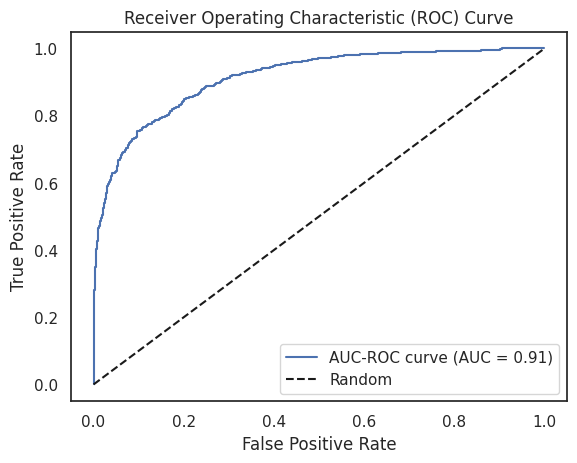

In [ ]:
y_pred_prob = logreg.predict_proba(X_test)[:, 1]

# Compute the false positive rate, true positive rate, and threshold values
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Calculate the AUC-ROC score
auc_roc = roc_auc_score(y_test, y_pred_prob)

# Plot the ROC curve
plt.plot(fpr, tpr, label='AUC-ROC curve (AUC = {:.2f})'.format(auc_roc))
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

## Decision Tree
A decision tree is a simple yet powerful machine learning algorithm used for both classification and regression tasks. It models decisions or predictions based on a series of hierarchical, tree-like structures.

In [ ]:
clf = DecisionTreeClassifier(random_state=42)

clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

# Calculate the accuracy of the classifier
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 1.0


In [ ]:
clf = DecisionTreeClassifier(max_depth=5, min_samples_leaf=40)

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 1.0


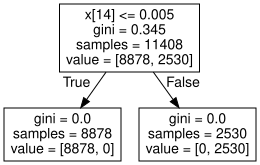

In [ ]:
dot_data = export_graphviz(clf, out_file=None)
graph = graphviz.Source(dot_data)
graph

In [ ]:
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2212
           1       1.00      1.00      1.00       640

    accuracy                           1.00      2852
   macro avg       1.00      1.00      1.00      2852
weighted avg       1.00      1.00      1.00      2852



Decision tree here gave us an overfitting result even after trying different values for max_depth and min_samples_leaf, so we will try other models.

## XGBoost
Gradient Boosting: XGBoost is based on the gradient boosting framework, which combines multiple weak learners (decision trees) to create a strong predictive model. It builds an ensemble of trees iteratively, where each subsequent tree corrects the errors made by the previous trees.

In [ ]:
!pip install xgboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import xgboost as xgb

clf = xgb.XGBClassifier()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 1.0


In [ ]:
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2212
           1       1.00      1.00      1.00       640

    accuracy                           1.00      2852
   macro avg       1.00      1.00      1.00      2852
weighted avg       1.00      1.00      1.00      2852



The XGBoost model overfits too 😑 , we will try the GridSearch to find the best parameters and retrain the XGBoost model.

In [ ]:
from xgboost import XGBClassifier


# Create an XGBoost classifier object
xgb = XGBClassifier()

# Define the parameter grid to search
param_grid = {
    'max_depth': [3, 4, 5],
    'min_child_weight': [1, 2, 3],
    'gamma': [0, 0.1, 0.2],
    'lambda': [0, 0.1, 0.2]
}

# Create a GridSearchCV object
grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, cv=5, scoring='accuracy')

# Fit the GridSearchCV object to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Print the best parameters and best score
print("Best Parameters:", best_params)
print("Best Score:", best_score)

Best Parameters: {'gamma': 0, 'lambda': 0, 'max_depth': 3, 'min_child_weight': 1}
Best Score: 1.0


In [ ]:
import xgboost as xgb
best_xgb = xgb.XGBClassifier(max_depth=3, min_child_weight=1, gamma=0, reg_lambda=0)
best_xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [ ]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: {:.2f}".format(accuracy))

Accuracy: 1.00


## SVM
SVM is primarily used for binary classification, where the goal is to separate instances into two classes. However, SVM can also be extended to handle multi-class classification problems.
SVM is known for its robustness to outliers. Since SVM relies on support vectors, which are the instances closest to the decision boundary, outliers have less influence on the model's construction compared to other algorithms.In fact, it can handle both linearly separable and non-linearly separable data. It can also handle high-dimensional feature spaces effectively and is less prone to overfitting.

In [ ]:
clf = SVC()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


Accuracy: 0.8828892005610098


In [ ]:
cm= confusion_matrix(y_test, y_pred)
cm

array([[2188,   24],
       [ 310,  330]])

<Axes: >

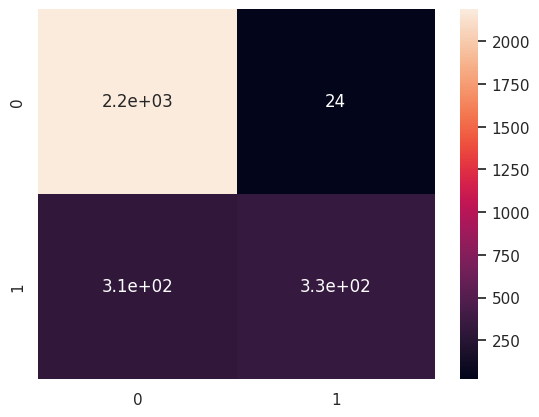

In [ ]:
sns.heatmap(cm, annot=True)

In [ ]:

# Define the models
models = [
    ('Linear Regression', LinearRegression()),
    ('Classification Tree', DecisionTreeClassifier()),
    ('XGBoost', XGBClassifier()),
    ('SVM', SVC())
]

# Perform cross-validation and evaluate models
for name, model in models:
    scores = cross_val_score(model, X, y, cv=5, scoring='accuracy')
    print(f"{name}:")
    print("Mean Accuracy:", scores.mean())
    print("Accuracy Scores:", scores)
    print("\n")

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:794: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 115, in __call__
    score = scorer._score(cached_call, estimator, *args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_param_validation.py", line 192, in wrapper
    return func(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py", line 221, in accuracy_score
    y_type, y_true, y_pred = _check_targets(y_true, y_pred)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py", line 95, in _check_targets
  

Linear Regression:
Mean Accuracy: nan
Accuracy Scores: [nan nan nan nan nan]


Classification Tree:
Mean Accuracy: 1.0
Accuracy Scores: [1. 1. 1. 1. 1.]


XGBoost:
Mean Accuracy: 1.0
Accuracy Scores: [1. 1. 1. 1. 1.]


SVM:
Mean Accuracy: 0.8671107994389902
Accuracy Scores: [0.86430575 0.88078541 0.86991585 0.85939691 0.86115007]




# Unsupervised Machine Learning Building

## PCA
PCA, which stands for Principal Component Analysis, is a dimensionality reduction technique commonly used in data analysis and machine learning. It aims to transform a high-dimensional dataset into a lower-dimensional representation while retaining the most important information and minimizing data loss. It reduces the number of variables (dimensions) in a dataset while preserving as much information as possible. It achieves this by creating a new set of variables, called principal components, which are linear combinations of the original variables.

In [ ]:
df2 = df1.drop(columns = ['RainTomorrow'])
df2.head()

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,RainToday,RISK_MM
0,0,23.2,35.8,0.0,1,26.0,8,15,13.0,9.0,46.0,29.0,1009.2,0,0.6
1,0,20.1,31.1,0.6,13,35.0,12,15,2.0,15.0,45.0,27.0,1009.5,0,0.0
2,0,13.6,29.4,0.0,14,35.0,10,14,19.0,11.0,56.0,28.0,1009.3,0,0.0
3,0,13.9,29.2,0.0,10,24.0,9,9,11.0,11.0,53.0,38.0,1007.8,0,0.0
4,0,16.0,28.9,0.0,10,31.0,1,12,4.0,9.0,57.0,31.0,1004.3,0,0.0


In [ ]:
!pip install factor_analyzer

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 2.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 202.5/202.5 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.8/98.8 kB 11.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 50.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 468.5/468.5 kB 40.2 MB/s eta 0:00:00
  Created wheel for factor_analyzer: filename=factor_analyzer-0.4.1-py2.py3-none-any.whl size=42014 sha256=9d8dfeebff6eb7f3ebceedb13e6836d77ea4c17fcf07872f1899746995cf8823
  Stored in directory: /root/.cache/pip/wheels/c5/94/da/41abe415f64706710726291086a814dd8b9e0dab1c491ef6ed
Successfully built factor_analyzer


In [ ]:
from factor_analyzer import FactorAnalyzer


In [ ]:
#Data normalization
scaler = StandardScaler()
scaled_df = scaler.fit_transform(df2)

# Normalizing the Data
normalized_df = normalize(scaled_df)

# Converting the numpy array into a pandas DataFrame
normalized_df = pd.DataFrame(normalized_df, columns= df2.columns)

In [ ]:
normalized_df.head()

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,RainToday,RISK_MM
0,-0.334565,0.388951,0.444610,-0.061685,-0.306303,-0.200925,-0.002660,0.377330,0.013099,-0.186715,-0.288981,-0.246469,-0.251653,-0.117281,-0.048460
1,-0.367864,0.297799,0.298139,-0.052743,0.310267,-0.042604,0.214320,0.414886,-0.281072,-0.043913,-0.331242,-0.294080,-0.264097,-0.128954,-0.068329
2,-0.430545,0.029846,0.268199,-0.079381,0.426243,-0.049863,0.123707,0.419973,0.205486,-0.177319,-0.213890,-0.330682,-0.318931,-0.150927,-0.079972
3,-0.507638,0.052533,0.305024,-0.093595,0.204928,-0.359547,0.070911,0.108412,-0.054260,-0.209069,-0.308074,-0.230648,-0.463004,-0.177952,-0.094291
4,-0.391679,0.134201,0.222385,-0.072216,0.158117,-0.129745,-0.407905,0.262696,-0.242067,-0.218590,-0.180209,-0.263970,-0.513808,-0.137302,-0.072752


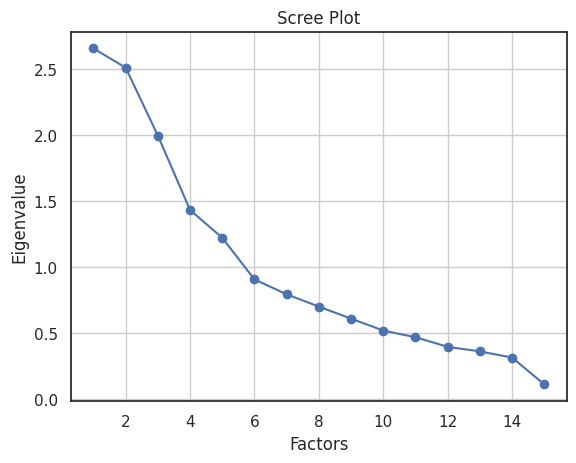

In [ ]:
fa = FactorAnalyzer(rotation='varimax')
fa.fit(normalized_df)
# Check Eigenvalues
ev, v = fa.get_eigenvalues()
# Create scree plot using matplotlib
plt.scatter(range(1,normalized_df.shape[1]+1),ev)
plt.plot(range(1,normalized_df.shape[1]+1),ev)
plt.title('Scree Plot')
plt.xlabel('Factors')
plt.ylabel('Eigenvalue')
plt.grid()
plt.show()

Only the eigenvalues greater than 1 are considered to be significant factors.

Upon examining the visualization, it is clear that only 5 factors have eigenvalues greater than one, indicating that we should choose only 5 factors or unobserved variables.

In [ ]:
fa = FactorAnalyzer(n_factors=5,rotation='varimax')
fa.fit(normalized_df)
factor_df=pd.DataFrame(fa.loadings_,index=normalized_df.columns)
print(factor_df)

                      0         1         2         3         4
Location       0.149521  0.036715 -0.019745  0.356128 -0.065229
MinTemp        0.213187  0.713502  0.074000  0.339195 -0.214354
MaxTemp       -0.023114  0.911421 -0.122266 -0.259762 -0.289401
Rainfall       0.056018  0.027003  0.800142 -0.004588  0.026230
WindGustDir    0.126564 -0.048871  0.037276 -0.107516  0.696222
WindGustSpeed  0.701938  0.232947  0.130489  0.063180  0.093141
WindDir9am    -0.185691 -0.098482  0.042155  0.149873  0.453257
WindDir3pm     0.063073 -0.016602  0.011146 -0.119464  0.670041
WindSpeed9am   0.700574  0.021443  0.053538 -0.031378 -0.077460
WindSpeed3pm   0.644233  0.070565  0.023889  0.126652  0.048892
Humidity9am   -0.368411 -0.127467  0.370602  0.449624  0.021867
Humidity3pm   -0.053269 -0.095110  0.274181  0.950672 -0.006273
Pressure3pm   -0.133801 -0.485432 -0.088836  0.029168 -0.093316
RainToday      0.047763  0.021315  0.759784  0.077559  0.065648
RISK_MM        0.071953  0.048114  0.301

In [ ]:
print(pd.DataFrame(fa.get_factor_variance(),index=['Variance','Proportional Var','Cumulative Var']))

                         0         1         2         3         4
Variance          1.688437  1.677625  1.573562  1.530615  1.304366
Proportional Var  0.112562  0.111842  0.104904  0.102041  0.086958
Cumulative Var    0.112562  0.224404  0.329308  0.431349  0.518307


In [ ]:
pca = PCA(n_components=5)
principalComponents = pca.fit_transform(normalized_df)
principalDf = pd.DataFrame(data = principalComponents, columns=['p1', 'p2', 'p3','p4','p5'])
principalDf.head(2)

,p1,p2,p3,p4,p5
0,0.381550,-0.471618,-0.036446,0.538749,-0.054487
1,0.083393,-0.473333,0.409780,0.685892,-0.141682


## KMeans
KMeans is an unsupervised machine learning algorithm used for clustering analysis. Its primary goal is to partition a given dataset into K clusters, where each cluster represents a group of similar data points.

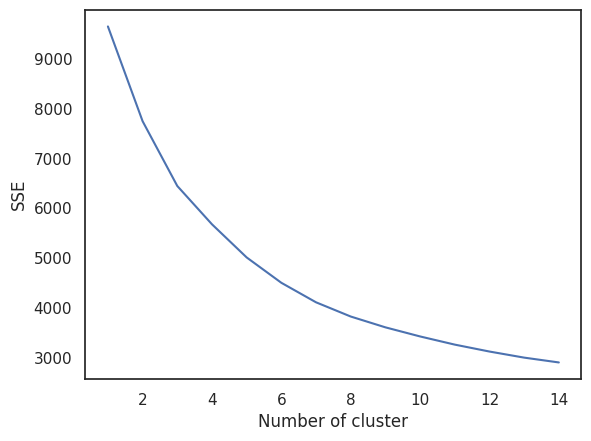

In [ ]:

sse = {}
for k in range(1, 15):
    kmeans = KMeans(n_clusters=k, max_iter=1000, n_init = 10).fit(principalDf)
    sse[k] = kmeans.inertia_
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

It was determined that the highest score was obtained when k=5, indicating that the optimal number of clusters for this dataset is 5.

In [ ]:
kmean= KMeans(n_clusters = 5, max_iter = 300, n_init = 10, random_state = 0)
kmean.fit(scaled_df)
labels=kmean.labels_

In [ ]:
finalDf = pd.concat([principalDf, pd.DataFrame({'cluster':labels})], axis = 1)
finalDf.head()

,p1,p2,p3,p4,p5,cluster
0,0.381550,-0.471618,-0.036446,0.538749,-0.054487,3
1,0.083393,-0.473333,0.409780,0.685892,-0.141682,3
2,0.052186,-0.543385,0.574787,0.496292,0.053123,3
3,0.059488,-0.634619,0.120853,0.593767,0.073057,3
4,0.208311,-0.561470,0.063460,0.556680,0.154154,3


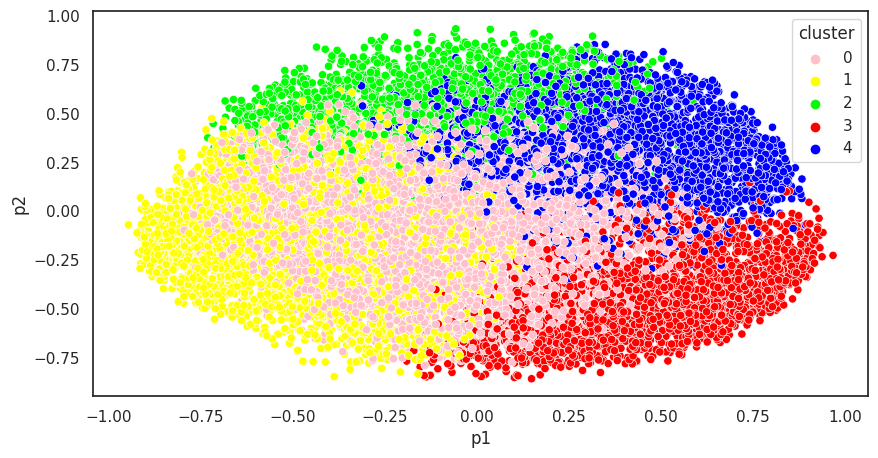

In [ ]:
plt.figure(figsize=(10,5))
ax = sns.scatterplot(x="p1", y="p2", hue="cluster", data=finalDf,palette=['pink','yellow','lime', 'red', 'blue'])
plt.show()

In [ ]:

score = silhouette_score(finalDf, labels, metric='euclidean',random_state=96)
print("The Silhouette score for KMeans clustering is:  ", score)

The Silhouette score for KMeans clustering is:   0.46788113239615403


The silhouette score of 0.46 suggests that the KMeans algorithm has generated moderate quality clusters, with some degree of separation between the clusters.

In [ ]:
clusters=pd.concat([df2, pd.DataFrame({'cluster':labels})], axis=1)
clusters.head()

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,RainToday,RISK_MM,cluster
0,0,23.2,35.8,0.0,1,26.0,8,15,13.0,9.0,46.0,29.0,1009.2,0,0.6,3
1,0,20.1,31.1,0.6,13,35.0,12,15,2.0,15.0,45.0,27.0,1009.5,0,0.0,3
2,0,13.6,29.4,0.0,14,35.0,10,14,19.0,11.0,56.0,28.0,1009.3,0,0.0,3
3,0,13.9,29.2,0.0,10,24.0,9,9,11.0,11.0,53.0,38.0,1007.8,0,0.0,3
4,0,16.0,28.9,0.0,10,31.0,1,12,4.0,9.0,57.0,31.0,1004.3,0,0.0,3


In [ ]:
clusters['cluster'].value_counts()

0    4190
1    2807
3    2549
4    2473
2    2241
Name: cluster, dtype: int64

In [ ]:
clusters.groupby('cluster').mean()

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,RainToday,RISK_MM
cluster,,,,,,,,,,,,,,,
0,3.894988,11.884439,23.445990,0.146539,4.460382,30.131265,8.285919,5.451551,6.851313,11.699045,73.395227,54.230788,1017.425346,0.024582,1.335084
1,2.554328,6.670645,18.745636,0.341040,11.726398,32.762380,10.333452,10.916281,10.281796,15.344852,70.188457,47.049519,1018.699572,0.071963,0.635233
2,4.009371,15.001339,21.841455,14.589692,7.427041,38.145025,9.559572,8.109326,11.850513,15.759036,85.273092,71.174029,1014.587282,0.986613,9.164480
3,2.478227,16.348843,31.910043,0.253747,7.356610,41.464496,5.294233,8.079247,15.905061,16.652805,48.582189,25.529227,1011.743703,0.044331,0.647313
4,5.729074,16.758633,23.281035,1.441165,6.601698,48.674889,6.553174,6.511524,21.458552,27.224019,69.604933,66.537404,1014.953862,0.205014,3.757056


##Hierarchical Clustering
Hierarchical clustering is an unsupervised machine learning algorithm used for clustering analysis. It aims to group similar data points into clusters based on their proximity and hierarchical relationships.

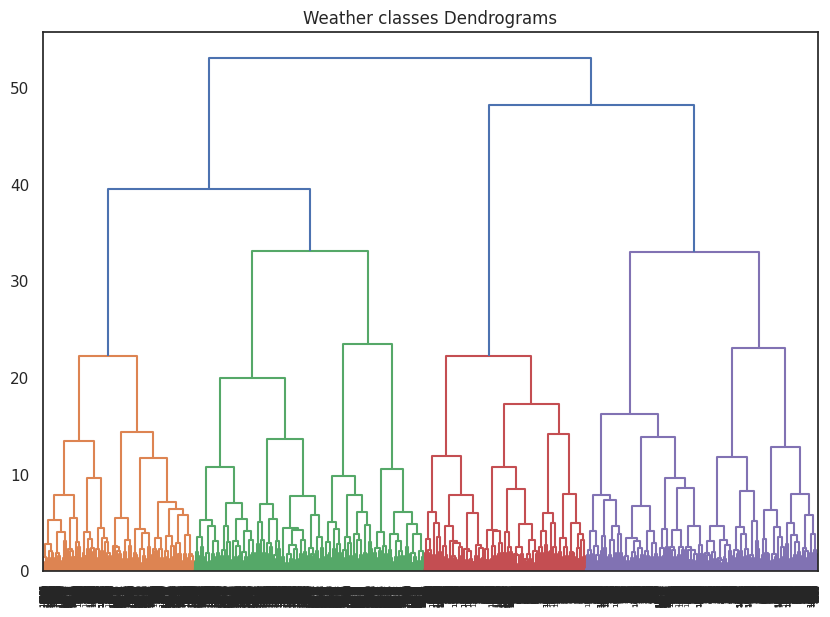

In [ ]:

plt.figure(figsize=(10,7))
plt.title("Weather classes Dendrograms")
dend=shc.dendrogram(shc.linkage(principalDf, method="ward"))

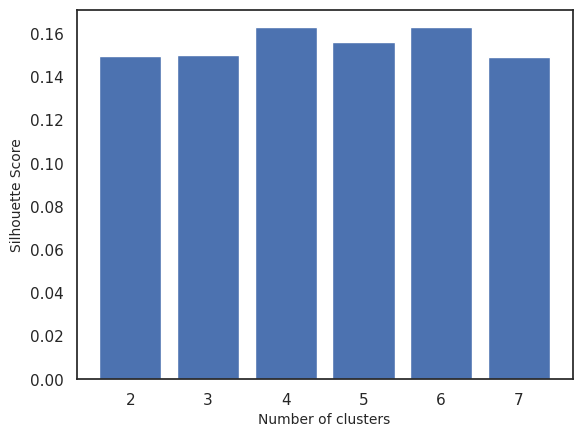

In [ ]:

silhouette_scores = []

for n_cluster in range(2, 8):
    silhouette_scores.append(
        silhouette_score(principalDf, AgglomerativeClustering(n_clusters=n_cluster, linkage='ward').fit_predict(principalDf)))

# Plotting a bar graph to compare the results
k = [2, 3, 4, 5, 6,7]
plt.bar(k, silhouette_scores)
plt.xlabel('Number of clusters', fontsize = 10)
plt.ylabel('Silhouette Score', fontsize = 10)
plt.show()

In [ ]:
model=AgglomerativeClustering(n_clusters=4, linkage='ward')
clust_labels= model.fit_predict(principalDf)

In [ ]:
agglomerative=pd.DataFrame(clust_labels)
agglomerative.value_counts()

1    4254
0    4228
2    2977
3    2801
dtype: int64

In [ ]:
score = silhouette_score(principalDf, clust_labels, metric='euclidean',random_state=96)
print("The Silhouette score for Hierachical clustering is:  ", score)

The Silhouette score for Hierachical clustering is:   0.1629324379526082


We can conclude that there are 4 seasons in Australia.

Now we will study our initial dataset to see the characteristics of every weather parameter to every month independently to check what are the months of seasons in Australia.

In [ ]:
df_seasons = pd.read_csv('weather.csv')
df_seasons

,Unnamed: 0,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow
0,0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No
1,1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No
2,2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No
3,3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No
4,4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,24995,2013-03-09,Penrith,16.5,30.0,0.0,NaN,NaN,NE,26.0,...,41.0,NaN,NaN,NaN,NaN,21.6,29.4,No,0.0,No
24996,24996,2013-03-10,Penrith,16.7,30.5,0.0,NaN,NaN,NE,24.0,...,44.0,NaN,NaN,NaN,NaN,21.3,29.0,No,0.0,No
24997,24997,2013-03-11,Penrith,18.3,29.8,0.0,NaN,NaN,ENE,26.0,...,49.0,NaN,NaN,NaN,NaN,20.6,28.2,No,0.0,No
24998,24998,2013-03-12,Penrith,17.5,28.1,0.0,NaN,NaN,NNE,22.0,...,54.0,NaN,NaN,NaN,NaN,21.2,26.8,No,0.0,No


In [ ]:
df_seasons['Date'] = pd.to_datetime(df_seasons['Date'])

# Extract components from the 'Date' column
df_seasons['Year'] = df_seasons['Date'].dt.year
df_seasons['Month'] = df_seasons['Date'].dt.month
df_seasons['Day'] = df_seasons['Date'].dt.day
df_seasons['Weekday'] = df_seasons['Date'].dt.weekday

# Drop the original 'Date' column if no longer needed
df_seasons = df_seasons.drop('Date', axis=1)

print(df_seasons)


       Unnamed: 0 Location  MinTemp  MaxTemp  Rainfall  Evaporation  Sunshine  \
0               0   Albury     13.4     22.9       0.6          NaN       NaN   
1               1   Albury      7.4     25.1       0.0          NaN       NaN   
2               2   Albury     12.9     25.7       0.0          NaN       NaN   
3               3   Albury      9.2     28.0       0.0          NaN       NaN   
4               4   Albury     17.5     32.3       1.0          NaN       NaN   
...           ...      ...      ...      ...       ...          ...       ...   
24995       24995  Penrith     16.5     30.0       0.0          NaN       NaN   
24996       24996  Penrith     16.7     30.5       0.0          NaN       NaN   
24997       24997  Penrith     18.3     29.8       0.0          NaN       NaN   
24998       24998  Penrith     17.5     28.1       0.0          NaN       NaN   
24999       24999  Penrith     15.4     30.9       0.0          NaN       NaN   

      WindGustDir  WindGust

In [ ]:
years_to_drop = [2008, 2009, 2010, 2016, 2017]
df_seasons = df_seasons[~df_seasons['Year'].isin(years_to_drop)]
df_seasons

,Unnamed: 0,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow,Year,Month,Day,Weekday
752,752,Albury,23.2,35.8,0.0,NaN,NaN,ENE,26.0,S,...,NaN,26.8,32.8,No,0.6,No,2011,1,1,5
753,753,Albury,20.1,31.1,0.6,NaN,NaN,W,35.0,SW,...,NaN,25.1,30.2,No,0.0,No,2011,1,2,6
754,754,Albury,13.6,29.4,0.0,NaN,NaN,WNW,35.0,SSE,...,NaN,20.2,28.4,No,0.0,No,2011,1,3,0
755,755,Albury,13.9,29.2,0.0,NaN,NaN,SSE,24.0,SE,...,NaN,19.9,27.9,No,0.0,No,2011,1,4,1
756,756,Albury,16.0,28.9,0.0,NaN,NaN,SSE,31.0,ENE,...,NaN,22.0,26.8,No,0.0,No,2011,1,5,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,24995,Penrith,16.5,30.0,0.0,NaN,NaN,NE,26.0,SSE,...,NaN,21.6,29.4,No,0.0,No,2013,3,9,5
24996,24996,Penrith,16.7,30.5,0.0,NaN,NaN,NE,24.0,ESE,...,NaN,21.3,29.0,No,0.0,No,2013,3,10,6
24997,24997,Penrith,18.3,29.8,0.0,NaN,NaN,ENE,26.0,NaN,...,NaN,20.6,28.2,No,0.0,No,2013,3,11,0
24998,24998,Penrith,17.5,28.1,0.0,NaN,NaN,NNE,22.0,S,...,NaN,21.2,26.8,No,0.0,No,2013,3,12,1


In [ ]:
# Convert the 'Month' column to numeric values
df_seasons['Month'] = pd.to_numeric(df_seasons['Month'], errors='coerce')

# Define the seasons in Australia
seasons = {
    'Winter': [6, 7, 8],
    'Spring': [9, 10, 11],
    'Summer': [12, 1, 2],
    'Autumn': [3, 4, 5]
}

# Create a new column 'Season' to store the season for each date
df_seasons['Season'] = df_seasons['Month'].apply(lambda x: next((season for season, months in seasons.items() if x in months), None))

# Group by 'Month' and calculate the mean for each column
monthly_means = df_seasons.groupby('Month').mean()

# Print the characteristics of each month
for month, row in monthly_means.iterrows():
    print(f"Month: {month}")
    print(row)
    print()

Month: 1
Unnamed: 0       12619.680718
MinTemp             19.289179
MaxTemp             30.003852
Rainfall             3.308183
Evaporation          9.029151
Sunshine             8.268464
WindGustSpeed       41.112511
WindSpeed9am        14.396361
WindSpeed3pm        18.324281
Humidity9am         66.089046
Humidity3pm         50.937002
Pressure9am       1012.788224
Pressure3pm       1010.511810
Cloud9am             4.194483
Cloud3pm             4.372253
Temp9am             23.559953
Temp3pm             28.245751
RISK_MM              3.728337
Year              2012.877440
Day                 16.135051
Weekday              2.998439
Name: 1, dtype: float64

Month: 2
Unnamed: 0       12524.775553
MinTemp             19.093823
MaxTemp             29.069777
Rainfall             4.040635
Evaporation          7.851289
Sunshine             8.285171
WindGustSpeed       38.595849
WindSpeed9am        12.584764
WindSpeed3pm        16.453863
Humidity9am         72.249201
Humidity3pm         55.1212

<ipython-input-78-2fe1ec3bfa61>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_seasons['Month'] = pd.to_numeric(df_seasons['Month'], errors='coerce')
<ipython-input-78-2fe1ec3bfa61>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_seasons['Season'] = df_seasons['Month'].apply(lambda x: next((season for season, months in seasons.items() if x in months), None))


Here we can notice that:
- for months 12-1-2 (December, January and February) the values of minimum and maximum tempreratures are close and high it's Summer in Australia during these months.
- for months 3-4-5 (March, April and May) the values of minimum and maximum temperatures are close and they start to decrease it's Autumn in Australia.
- for months 6-7-8 (June, July and August) the values of minimum and maximum temperatures are close and they became lower it's Winter in Australia.
- for months 9-10-11 (September, October and November) the values of minimum and maimum temperatures are close and they became to increas it's Spring in Australia.

We can conclude that seasons in Australia are not the same in our Country becuse of the geographic location and it confirms the result we found in **Hierarchical Clustering**.

#Conclusion

As a conclusion of our analysis we can say that Australia has a very low annual average of rainfall and we noticed that when creating supervised machine learning models. In fact the overfitting of Linear regression model and XGBoost was because of the imbalanced data in the "RainTomorrow" column we have seen that 77,77% of data was "No" and 22,23% was "Yes".